<a href="https://colab.research.google.com/github/Ifihan/ehs-safety/blob/main/final_year_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [2]:
%cd /content/gdrive/MyDrive/
!pwd

/content/gdrive/MyDrive
/content/gdrive/MyDrive


In [3]:
%cd final_year_project/

/content/gdrive/MyDrive/final_year_project


In [ ]:
# import os

# # %cd final_year_project

# if not os.path.isdir("final_year_project"):
#     os.makedirs("final_year_project")

# %cd final_year_project

## Installing YOLOv7

In [ ]:
# !git clone https://github.com/WongKinYiu/yolov7.git

## Installing Yolov7 dependencies

In [ ]:
# # Download YOLOv7 repository and install requirements
# %cd yolov7
# !pip install -r requirements.txt --quiet

In [ ]:
# %cd ..
# !pip install roboflow --quiet
# !pip install opencv-python-headless --quiet

# !pwd

In [ ]:
# from roboflow import Roboflow

# rf = Roboflow(api_key="hGCWVMS2IuKisClvroWk")
# project = rf.workspace("ifihan").project("ehs-detection")
# version = project.version(1)
# dataset = version.download("yolov7pytorch")

In [ ]:
# !wget https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7_training.pt

In [ ]:
# %cd yolov7
# !python train.py --batch 16 --epochs 200 --data 'EHS-Detection-1/data.yaml' --weights 'yolov7_training.pt' --device 0

In [ ]:
# Run evaluation
# !python detect.py --weights runs/train/exp4/weights/best.pt --conf 0.1 --source 'EHS-Detection-1/test/images'

In [ ]:
# # prompt: display inference on ALL test images

# # Run inference on all test images
# !python detect.py --weights runs/train/exp4/weights/best.pt --conf 0.1 --source {dataset.location}/test/images --save-txt --save-hybrid


In [ ]:
# #display inference on ALL test images

# import glob
# from IPython.display import Image, display

# i = 0
# limit = 10000 # max images to print
# for imageName in glob.glob('yolov7/runs/detect/exp/*.jpg'): #assuming JPG
#     if i < limit:
#       display(Image(filename=imageName))
#       print("\n")
#     i = i + 1


## Using YOLO v8

In [4]:
!pip install roboflow --quiet
!pip install ultralytics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.8/871.8 kB 20.4 MB/s eta 0:00:00


In [5]:
from roboflow import Roboflow
from ultralytics import YOLO

In [6]:
rf = Roboflow(api_key="hGCWVMS2IuKisClvroWk")
project = rf.workspace("ifihan").project("ehs-detection")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.91, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to EHS-Detection-1 in yolov8:: 100%|██████████| 468/468 [00:03<00:00, 132.30it/s]


In [7]:
print(dataset.location)

/content/gdrive/MyDrive/final_year_project/EHS-Detection-1


In [8]:
import os
os.path.isfile(f"{dataset.location}/data.yaml")

print(dataset)
# remember to change the helmet in data.yml from helment to helmet

In [9]:
model = YOLO('yolov8s.pt')

In [11]:
print(dataset.location)

/content/gdrive/MyDrive/final_year_project/EHS-Detection-1


In [13]:
# Training

# model = YOLO('yolov8s.pt')
model.train(data=f"{dataset.location}/data.yaml", epochs=50, imgsz=640)


# !yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=50 imgsz=640

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/gdrive/MyDrive/final_year_project/EHS-Detection-1/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fal

100%|██████████| 755k/755k [00:00<00:00, 24.3MB/s]


Overriding model.yaml nc=80 with nc=9

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

train: Scanning /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/train/labels... 159 images, 0 backgrounds, 0 corrupt: 100%|██████████| 159/159 [00:01<00:00, 82.33it/s] 


train: New cache created: /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/valid/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 46.27it/s]


val: New cache created: /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/valid/labels.cache
Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.01G      1.681      6.322      1.743        130        640: 100%|██████████| 10/10 [00:08<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]

                   all         46        249     0.0629      0.414     0.0683     0.0376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.05G       1.34      3.013        1.4        182        640: 100%|██████████| 10/10 [00:03<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         46        249      0.392      0.569      0.466      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.05G      1.201      2.085       1.33        101        640: 100%|██████████| 10/10 [00:03<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.07it/s]

                   all         46        249      0.468      0.556      0.508      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.98G      1.164      1.837      1.281        184        640: 100%|██████████| 10/10 [00:03<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.84it/s]

                   all         46        249      0.493      0.722      0.526      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.08G      1.142      1.731      1.263        105        640: 100%|██████████| 10/10 [00:04<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all         46        249      0.525      0.659      0.548      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.05G      1.096      1.584      1.236        112        640: 100%|██████████| 10/10 [00:03<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all         46        249      0.512      0.631      0.529      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.98G      1.101      1.505      1.225        151        640: 100%|██████████| 10/10 [00:02<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.01it/s]

                   all         46        249       0.46      0.701      0.511      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.98G      1.056      1.409      1.219        102        640: 100%|██████████| 10/10 [00:03<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]

                   all         46        249      0.547      0.679      0.553       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.07G      1.016       1.36      1.188        149        640: 100%|██████████| 10/10 [00:03<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.01it/s]

                   all         46        249      0.508      0.593      0.502      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.08G      1.023      1.253      1.179        137        640: 100%|██████████| 10/10 [00:02<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]

                   all         46        249      0.552       0.67      0.529       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         4G      1.022      1.308      1.185        139        640: 100%|██████████| 10/10 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         46        249      0.497      0.656      0.518      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         4G      1.014      1.312        1.2         84        640: 100%|██████████| 10/10 [00:03<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.20it/s]

                   all         46        249      0.445       0.65      0.534      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.76G       1.03      1.264      1.181        161        640: 100%|██████████| 10/10 [00:03<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         46        249      0.475      0.654      0.535       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.92G     0.9825      1.205       1.16        151        640: 100%|██████████| 10/10 [00:02<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.65it/s]

                   all         46        249      0.529      0.677      0.533      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.98G      1.014      1.219      1.166        137        640: 100%|██████████| 10/10 [00:03<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.54it/s]

                   all         46        249      0.502      0.716      0.546      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.07G     0.9711      1.172      1.158        113        640: 100%|██████████| 10/10 [00:04<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         46        249      0.472      0.638      0.509      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         4G     0.9686      1.136      1.173        148        640: 100%|██████████| 10/10 [00:03<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.64it/s]


                   all         46        249      0.566      0.647      0.557      0.362

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         4G      0.943      1.124      1.148        164        640: 100%|██████████| 10/10 [00:03<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         46        249      0.502      0.713      0.571      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.87G     0.8992      1.019      1.102        101        640: 100%|██████████| 10/10 [00:03<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.47it/s]

                   all         46        249      0.594      0.692      0.612      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.01G     0.9036      1.009      1.103        148        640: 100%|██████████| 10/10 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

                   all         46        249      0.656      0.682      0.645      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.86G     0.8735      1.045      1.128        180        640: 100%|██████████| 10/10 [00:02<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         46        249      0.576      0.718      0.646      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         4G     0.8834      1.037      1.122        129        640: 100%|██████████| 10/10 [00:04<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]

                   all         46        249      0.568      0.677      0.596      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.86G     0.8602     0.9979      1.087        176        640: 100%|██████████| 10/10 [00:03<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.52it/s]

                   all         46        249      0.472      0.724      0.561      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.93G     0.8546     0.9745      1.092         98        640: 100%|██████████| 10/10 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.82it/s]

                   all         46        249      0.549      0.665      0.594      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.91G     0.8731     0.9542      1.101         99        640: 100%|██████████| 10/10 [00:03<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


                   all         46        249      0.502      0.711      0.616       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.01G     0.8346     0.9585      1.094         99        640: 100%|██████████| 10/10 [00:03<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

                   all         46        249      0.567      0.738      0.637      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.05G      0.845     0.8976      1.086         95        640: 100%|██████████| 10/10 [00:02<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.83it/s]

                   all         46        249      0.558      0.764      0.646      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       3.9G     0.8077     0.8583       1.07        134        640: 100%|██████████| 10/10 [00:03<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         46        249      0.573      0.695      0.647      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.97G      0.788     0.8489       1.04        155        640: 100%|██████████| 10/10 [00:03<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]

                   all         46        249       0.59      0.666      0.653      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.08G     0.7811     0.8329      1.046        140        640: 100%|██████████| 10/10 [00:03<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.77it/s]

                   all         46        249      0.616      0.651      0.645      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.02G     0.7763     0.8446      1.045        108        640: 100%|██████████| 10/10 [00:03<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.87it/s]

                   all         46        249      0.587      0.702      0.636      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.04G      0.765      0.797      1.051        130        640: 100%|██████████| 10/10 [00:03<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.77it/s]

                   all         46        249      0.588      0.666      0.634      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.01G      0.754     0.8177      1.033        111        640: 100%|██████████| 10/10 [00:03<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.85it/s]

                   all         46        249      0.607      0.686      0.637      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.93G      0.764     0.8045      1.047        105        640: 100%|██████████| 10/10 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.41it/s]

                   all         46        249      0.654      0.674       0.66      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       3.9G      0.741     0.8165      1.046         84        640: 100%|██████████| 10/10 [00:03<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.07it/s]

                   all         46        249      0.667      0.655      0.671      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.05G     0.7299     0.7776       1.04         86        640: 100%|██████████| 10/10 [00:03<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         46        249      0.672      0.665      0.672      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.99G     0.7304     0.7377      1.005        137        640: 100%|██████████| 10/10 [00:03<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.46it/s]


                   all         46        249      0.673      0.666      0.667      0.481

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         4G     0.7452     0.7532       1.03        116        640: 100%|██████████| 10/10 [00:03<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all         46        249      0.624       0.71       0.67      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.97G     0.7063     0.7169      1.028        122        640: 100%|██████████| 10/10 [00:02<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.70it/s]


                   all         46        249      0.634      0.676      0.672      0.483

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.06G     0.7166     0.7273      1.028        100        640: 100%|██████████| 10/10 [00:02<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.71it/s]


                   all         46        249       0.65      0.685      0.679      0.484
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.99G     0.6645     0.6758      1.001         51        640: 100%|██████████| 10/10 [00:09<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         46        249       0.67      0.664      0.679      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         4G     0.6366     0.6502     0.9725         73        640: 100%|██████████| 10/10 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.98it/s]

                   all         46        249       0.63      0.702      0.673      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.99G     0.6076     0.6127     0.9733         90        640: 100%|██████████| 10/10 [00:02<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.88it/s]

                   all         46        249      0.646      0.669      0.664      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.84G     0.6316     0.6242      1.004         75        640: 100%|██████████| 10/10 [00:03<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.42it/s]

                   all         46        249      0.616      0.697      0.669      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.02G     0.6086     0.6114      0.972         59        640: 100%|██████████| 10/10 [00:02<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.55it/s]

                   all         46        249      0.595      0.698      0.663      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       3.9G     0.6111     0.5757      0.967         74        640: 100%|██████████| 10/10 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.56it/s]

                   all         46        249      0.589      0.717       0.65      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.97G     0.5766     0.5389     0.9376         72        640: 100%|██████████| 10/10 [00:03<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.44it/s]

                   all         46        249      0.614      0.697       0.66      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.01G     0.5729     0.5562     0.9496        101        640: 100%|██████████| 10/10 [00:03<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.87it/s]

                   all         46        249      0.629       0.69      0.663      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.87G     0.5684     0.5448     0.9543         74        640: 100%|██████████| 10/10 [00:03<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.94it/s]

                   all         46        249      0.637      0.682      0.665      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.89G     0.5576     0.5195     0.9421         60        640: 100%|██████████| 10/10 [00:04<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]

                   all         46        249      0.632      0.697      0.665      0.493



50 epochs completed in 0.084 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 22.5MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,129,067 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]


                   all         46        249      0.632      0.697      0.665      0.492
          extinguisher         12         12      0.798      0.833      0.819      0.559
               harness         16         69      0.406      0.333      0.324      0.175
                helmet         25         26      0.874      0.962      0.959      0.557
             left-boot         26         30      0.674       0.69       0.77      0.669
            left-glove         26         29       0.37      0.384      0.321      0.244
            right-boot         23         26      0.651      0.859      0.705      0.532
           right-glove         23         25      0.409       0.47      0.428      0.348
            safety-box          7          7       0.68      0.857      0.822      0.623
                  vest         25         25       0.83       0.88      0.835       0.72
Speed: 0.2ms preprocess, 5.7ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ddcfffcd030>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470

In [14]:
trained_model = YOLO('/content/gdrive/MyDrive/final_year_project/runs/detect/train4/weights/best.pt')

In [ ]:
!pip install ray --quiet

In [ ]:
import pickle

file_path = "/content/gdrive/MyDrive/final_year_project/runs/detect/tune/tuner.pkl"

with open(file_path, 'rb') as file:
    tuned_model = pickle.load(file)

In [ ]:
import pickle

def load_and_extract_metrics(file_path):
    with open(file_path, 'rb') as file:
        metrics = pickle.load(file)

    if isinstance(metrics, dict):
        print("Evaluation Metrics:")
        for key, value in metrics.items():
            print(f"{key}: {value}")
    else:
        print("The loaded data is not a dictionary. Data type:", type(metrics))

# Replace 'evaluation_metrics.pkl' with the path to your .pkl file
file_path = '/content/gdrive/MyDrive/final_year_project/runs/detect/tune/tuner.pkl'
load_and_extract_metrics(file_path)


Evaluation Metrics:
_tune_config: TuneConfig(mode=None, metric=None, search_alg=None, scheduler=<ray.tune.schedulers.async_hyperband.AsyncHyperBandScheduler object at 0x7d9b16c91fc0>, num_samples=10, max_concurrent_trials=None, time_budget_s=None, reuse_actors=False, trial_name_creator=None, trial_dirname_creator=None, chdir_to_trial_dir='DEPRECATED')
_run_config: RunConfig(name='_tune_2024-07-05_00-13-06', storage_path='/content/gdrive/MyDrive/final_year_project/runs/detect/tune', verbose=1, callbacks=[<ray.air.integrations.wandb.WandbLoggerCallback object at 0x7d9b0dfdcd60>])
_entrypoint: AirEntrypoint.TUNER
_resume_config: None
_is_restored: False
_tuner_kwargs: {}
__trainable_name: _tune
__flattened_param_space_keys: ['bgr', 'box', 'cls', 'copy_paste', 'data', 'degrees', 'fliplr', 'flipud', 'hsv_h', 'hsv_s', 'hsv_v', 'lr0', 'lrf', 'mixup', 'momentum', 'mosaic', 'perspective', 'scale', 'shear', 'translate', 'warmup_epochs', 'warmup_momentum', 'weight_decay']


In [ ]:
# Run evaluation
result = model.val(split="test")
result.results_dict

# !yolo task=detect mode=val model=/content/gdrive/MyDrive/final_year_project/runs/detect/train2/weights/best.pt  data={dataset.location}/data.yaml

Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 11129067 parameters, 0 gradients, 28.5 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 14.6MB/s]
val: Scanning /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/test/labels.cache... 23 images, 0 backgrounds, 0 corrupt: 100%|██████████| 23/23 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:29<00:00, 14.73s/it]


                   all         23        148      0.632      0.765      0.676      0.488
          extinguisher          3          3          1      0.928      0.995       0.58
               harness         11         40      0.471        0.6      0.558      0.335
                helmet         11         14      0.763      0.857      0.805      0.658
             left-boot         16         17      0.492        0.8      0.533      0.436
            left-glove         14         22      0.522      0.547      0.506       0.36
            right-boot         15         17       0.49      0.882      0.662      0.542
           right-glove         13         15      0.544      0.667      0.472      0.371
            safety-box          5          5      0.631        0.8      0.722      0.484
                  vest         15         15      0.772        0.8      0.831      0.624
Speed: 15.2ms preprocess, 926.1ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/det

{'metrics/precision(B)': 0.6316426301501115,
 'metrics/recall(B)': 0.7645074581510515,
 'metrics/mAP50(B)': 0.6759135025070189,
 'metrics/mAP50-95(B)': 0.48781192801466544,
 'fitness': 0.5066220854639008}

In [ ]:
result = model.val(split="train")
result.results_dict

Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CPU (Intel Xeon 2.20GHz)


val: Scanning /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/train/labels.cache... 159 images, 0 backgrounds, 0 corrupt: 100%|██████████| 159/159 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [02:28<00:00, 14.82s/it]


                   all        159        861       0.95      0.946      0.981      0.873
          extinguisher         33         33      0.993          1      0.995      0.923
               harness         57        211      0.945      0.887      0.968      0.802
                helmet         82         92      0.981          1      0.995       0.87
             left-boot         88        101      0.864      0.882      0.938      0.847
            left-glove         92        111       0.96      0.928      0.989      0.845
            right-boot         87        102      0.868      0.922      0.961      0.856
           right-glove         90         96      0.948      0.958       0.99      0.875
            safety-box         30         30          1      0.953      0.995      0.902
                  vest         79         85      0.988      0.984      0.994      0.936
Speed: 8.4ms preprocess, 882.0ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/dete

{'metrics/precision(B)': 0.9496657337103183,
 'metrics/recall(B)': 0.9460387217047388,
 'metrics/mAP50(B)': 0.9806095834199776,
 'metrics/mAP50-95(B)': 0.8727663872093425,
 'fitness': 0.883550706830406}

In [ ]:
result = model.val(split="val")
result.results_dict

Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CPU (Intel Xeon 2.20GHz)


val: Scanning /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/valid/labels.cache... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:56<00:00, 18.80s/it]


                   all         46        249      0.604      0.668      0.656       0.47
          extinguisher         12         12      0.798      0.659      0.776      0.496
               harness         16         69      0.525      0.305      0.323      0.154
                helmet         25         26      0.846      0.923      0.971      0.541
             left-boot         26         30      0.649      0.767       0.66      0.548
            left-glove         26         29      0.414      0.345      0.371      0.287
            right-boot         23         26      0.505      0.769      0.632      0.462
           right-glove         23         25      0.424       0.52      0.486      0.373
            safety-box          7          7      0.467      0.857      0.837       0.65
                  vest         25         25      0.813      0.871      0.845       0.72
Speed: 6.8ms preprocess, 893.0ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/dete

{'metrics/precision(B)': 0.6044785495860203,
 'metrics/recall(B)': 0.6683411712225851,
 'metrics/mAP50(B)': 0.6558098591492743,
 'metrics/mAP50-95(B)': 0.4702255190989656,
 'fitness': 0.48878395310399647}

## Hypertuning

Here goes nothing

In [ ]:
!pip install -U ultralytics "ray[tune]" --quiet
!pip install wandb --quiet


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 MB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 54.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.2/300.2 kB 36.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.4 MB/s eta 0:00:00


In [ ]:
# Wandb login

import wandb
wandb.login()

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
model = YOLO('yolov8s.pt')

In [ ]:
# Tuning

result_grid = model.tune(data=f"{dataset.location}/data.yaml", use_ray=True)

# !yolo task=tune mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=30 iterations=300 optimizer="AdamW" plots=False save=False val=False

💡 Learn about RayTune at https://docs.ultralytics.com/integrations/ray-tune
WARNING ⚠️ search space not provided, using default search space.


2024-07-05 00:13:06,852	INFO wandb.py:318 -- Already logged into W&B.


+--------------------------------------------------------------+
| Configuration for experiment     _tune_2024-07-05_00-13-06   |
+--------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator       |
| Scheduler                        AsyncHyperBandScheduler     |
| Number of trials                 10                          |
+--------------------------------------------------------------+

View detailed results here: /content/gdrive/MyDrive/final_year_project/runs/detect/tune/_tune_2024-07-05_00-13-06
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2024-07-04_23-20-56_097446_533/artifacts/2024-07-05_00-13-06/_tune_2024-07-05_00-13-06/driver_artifacts`

Trial status: 10 PENDING
Current time: 2024-07-05 00:13:07. Total running time: 0s
Logical resource usage: 0/2 CPUs, 0/1 GPUs (0.0/1.0 accelerator_type:T4)
+-------------------------------------------------------------------------------

(_WandbLoggingActor pid=18486) wandb: Currently logged in as: ifihan (ifihan-projects). Use `wandb login --relogin` to force relogin
(_WandbLoggingActor pid=18486) wandb: Tracking run with wandb version 0.17.4
(_WandbLoggingActor pid=18486) wandb: Run data is saved locally in /tmp/ray/session_2024-07-04_23-20-56_097446_533/artifacts/2024-07-05_00-13-06/_tune_2024-07-05_00-13-06/driver_artifacts/_tune_5aa06_00001_1_bgr=0.0253,box=0.0470,cls=0.3392,copy_paste=0.7278,degrees=27.3839,fliplr=0.0454,flipud=0.1714,hsv_h=0.0142,hs_2024-07-05_00-13-06/wandb/run-20240705_001318-5aa06_00001
(_WandbLoggingActor pid=18486) wandb: Run `wandb offline` to turn off syncing.
(_WandbLoggingActor pid=18425) wandb: Syncing run _tune_5aa06_00000
(_WandbLoggingActor pid=18425) wandb: ⭐️ View project at https://wandb.ai/ifihan-projects/YOLOv8-tune
(_WandbLoggingActor pid=18425) wandb: 🚀 View run at https://wandb.ai/ifihan-projects/YOLOv8-tune/runs/5aa06_00000


(_tune pid=18348) Ultralytics YOLOv8.2.49 🚀 Python-3.10.12 torch-2.3.0+cu121 CPU (Intel Xeon 2.00GHz)
(raylet) WARNING: 16 PYTHON worker processes have been started on node: 4040cca4ce3eb2d4a9ccf75db702f9f070389d474e6de78205973acd with address: 172.28.0.12. This could be a result of using a large number of actors, or due to tasks blocked in ray.get() calls (see https://github.com/ray-project/ray/issues/3644 for some discussion of workarounds). [repeated 2x across cluster]
(_tune pid=18348) engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/gdrive/MyDrive/final_year_project/EHS-Detection-1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi

(_tune pid=18348) wandb: Currently logged in as: ifihan (ifihan-projects). Use `wandb login --relogin` to force relogin [repeated 2x across cluster]
(_WandbLoggingActor pid=18425) wandb: Tracking run with wandb version 0.17.4
(_WandbLoggingActor pid=18425) wandb: Run data is saved locally in /tmp/ray/session_2024-07-04_23-20-56_097446_533/artifacts/2024-07-05_00-13-06/_tune_2024-07-05_00-13-06/driver_artifacts/_tune_5aa06_00000_0_bgr=0.4696,box=0.1576,cls=0.5538,copy_paste=0.7458,degrees=30.2519,fliplr=0.8119,flipud=0.1803,hsv_h=0.0627,hs_2024-07-05_00-13-06/wandb/run-20240705_001318-5aa06_00000
(_WandbLoggingActor pid=18425) wandb: Run `wandb offline` to turn off syncing.
(_WandbLoggingActor pid=18486) wandb: Syncing run _tune_5aa06_00001
(_WandbLoggingActor pid=18486) wandb: ⭐️ View project at https://wandb.ai/ifihan-projects/YOLOv8-tune
(_WandbLoggingActor pid=18486) wandb: 🚀 View run at https://wandb.ai/ifihan-projects/YOLOv8-tune/runs/5aa06_00001
(_tune pid=18349) wandb: Tracking 

(_tune pid=18349) Freezing layer 'model.22.dfl.conv.weight'
(_tune pid=18349) Overriding model.yaml nc=80 with nc=9
(_tune pid=18349)                    from  n    params  module                                       arguments                     
(_tune pid=18349)  19                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]               [repeated 7x across cluster]
(_tune pid=18349)   8                  -1  1   1838080  ultralytics.nn.modules.block.C2f             [512, 512, 1, True]            [repeated 4x across cluster]
(_tune pid=18349)   9                  -1  1    656896  ultralytics.nn.modules.block.SPPF            [512, 512, 5]                 
(_tune pid=18349)  13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']           [repeated 2x across cluster]
(_tune pid=18349)  20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                            [repe

train: Scanning /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/train/labels.cache... 159 images, 0 backgrounds, 0 corrupt: 100%|██████████| 159/159 [00:00<?, ?it/s]


(_tune pid=18348) albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
(_tune pid=18349) Model summary: 225 layers, 11139083 parameters, 11139067 gradients, 28.7 GFLOPs
(_tune pid=18349) Transferred 349/355 items from pretrained weights
(_tune pid=18349) TensorBoard: Start with 'tensorboard --logdir runs/detect/train', view at http://localhost:6006/
(_tune pid=18349) albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
(_tune pid=18348) Plotting labels to runs/detect/train/labels.jpg... 
(_tune pid=18348) optimizer: 'optimizer=auto' found, ignoring 'lr0=0.07976309267417696' and 'momentum=0.7700593524607562' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
(_tune pid=18348) Freezing layer 'model.22.dfl.conv.weight'
(_tune pid=18349) Plotting labels 

  0%|          | 0/10 [00:00<?, ?it/s]
(_tune pid=18349) wandb: Currently logged in as: ifihan (ifihan-projects). Use `wandb login --relogin` to force relogin
(_tune pid=18348) wandb: Tracking run with wandb version 0.17.4
(_tune pid=18348) wandb: Run data is saved locally in /tmp/ray/session_2024-07-04_23-20-56_097446_533/artifacts/2024-07-05_00-13-06/_tune_2024-07-05_00-13-06/working_dirs/_tune_5aa06_00000_0_bgr=0.4696,box=0.1576,cls=0.5538,copy_paste=0.7458,degrees=30.2519,fliplr=0.8119,flipud=0.1803,hsv_h=0.0627,hs_2024-07-05_00-13-06/wandb/run-20240705_001342-6y2pr0uu
(_tune pid=18348) wandb: Run `wandb offline` to turn off syncing.
(_tune pid=18348) wandb: Syncing run train
(_tune pid=18348) wandb: ⭐️ View project at https://wandb.ai/ifihan-projects/YOLOv8
(_tune pid=18348) wandb: 🚀 View run at https://wandb.ai/ifihan-projects/YOLOv8/runs/6y2pr0uu
val: Scanning /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/valid/labels.cache... 46 images, 0 backgrounds, 0 corrupt: 10

(_tune pid=18348) TensorBoard: model graph visualization added ✅
(_tune pid=18348) Image sizes 640 train, 640 val
(_tune pid=18348) Using 0 dataloader workers
(_tune pid=18348) Logging results to runs/detect/train
(_tune pid=18348) Starting training for 100 epochs...
(_tune pid=18348) 
(_tune pid=18348)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
(_tune pid=18349) optimizer: 'optimizer=auto' found, ignoring 'lr0=0.07460488971778607' and 'momentum=0.8531155680036941' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
(_tune pid=18349) optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005324396584460357), 63 bias(decay=0.0)
(_tune pid=18349) 
(raylet) WARNING: 18 PYTHON worker processes have been started on node: 4040cca4ce3eb2d4a9ccf75db702f9f070389d474e6de78205973acd with address: 172.28.0.12. This could be a result of using a large number of actors, or due to tasks blocked 

(raylet) [2024-07-05 00:15:04,175 E 2738 2738] (raylet) node_manager.cc:3064: 44 Workers (tasks / actors) killed due to memory pressure (OOM), 0 Workers crashed due to other reasons at node (ID: 4040cca4ce3eb2d4a9ccf75db702f9f070389d474e6de78205973acd, IP: 172.28.0.12) over the last time period. To see more information about the Workers killed on this node, use `ray logs raylet.out -ip 172.28.0.12`
(raylet) 
(raylet) Refer to the documentation on how to address the out of memory issue: https://docs.ray.io/en/latest/ray-core/scheduling/ray-oom-prevention.html. Consider provisioning more memory on this node or reducing task parallelism by requesting more CPUs per task. To adjust the kill threshold, set the environment variable `RAY_memory_usage_threshold` when starting Ray. To disable worker killing, set the environment variable `RAY_memory_monitor_refresh_ms` to zero.
  0%|          | 0/10 [00:00<?, ?it/s]


Trial status: 2 RUNNING | 8 PENDING
Current time: 2024-07-05 00:15:07. Total running time: 2min 0s
Logical resource usage: 2.0/2 CPUs, 0/1 GPUs (0.0/1.0 accelerator_type:T4)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status           lr0        lrf     momentum     weight_decay     warmup_epochs     warmup_momentum         box        cls         hsv_h       hsv_s       hsv_v     degrees     translate        scale      shear     perspective      flipud      fliplr         bgr      mosaic      mixup     copy_paste |
+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

(_WandbLoggingActor pid=20499) wandb: Currently logged in as: ifihan (ifihan-projects). Use `wandb login --relogin` to force relogin
(_WandbLoggingActor pid=20499) wandb: Tracking run with wandb version 0.17.4
(_WandbLoggingActor pid=20499) wandb: Run data is saved locally in /tmp/ray/session_2024-07-04_23-20-56_097446_533/artifacts/2024-07-04_23-44-23/_tune_2024-07-04_23-44-23/driver_artifacts/_tune_578ba_00000_0_bgr=0.3570,box=0.0299,cls=0.2345,copy_paste=0.0202,degrees=35.5970,fliplr=0.8135,flipud=0.0946,hsv_h=0.0956,hs_2024-07-04_23-44-23/wandb/run-20240705_001528-578ba_00000
(_WandbLoggingActor pid=20499) wandb: Run `wandb offline` to turn off syncing.
(_WandbLoggingActor pid=20499) wandb: Syncing run _tune_578ba_00000
(_WandbLoggingActor pid=20499) wandb: ⭐️ View project at https://wandb.ai/ifihan-projects/YOLOv8-tune
(_WandbLoggingActor pid=20499) wandb: 🚀 View run at https://wandb.ai/ifihan-projects/YOLOv8-tune/runs/578ba_00000
(raylet) [2024-07-05 00:16:04,182 E 2738 2738] (ra

KeyboardInterrupt: 

In [ ]:
# predicting

!yolo task=detect mode=predict model=/content/gdrive/MyDrive/final_year_project/runs/detect/train2/weights/best.pt conf=0.25 source={dataset.location}/test/images

Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129067 parameters, 0 gradients, 28.5 GFLOPs

image 1/23 /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/test/images/IMG-20240126-WA0179_jpg.rf.d7f9ed2341c1002245e34ee50cf84007.jpg: 640x640 2 left-boots, 2 right-boots, 2 right-gloves, 1 vest, 16.4ms
image 2/23 /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/test/images/IMG-20240127-WA0041_jpg.rf.5128ac31e8a783167ca18fd51edf1b4b.jpg: 640x640 1 safety-box, 16.4ms
image 3/23 /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/test/images/IMG-20240130-WA0052_jpg.rf.e604ee0cea33ebd88d3852ff26b58949.jpg: 640x640 2 left-boots, 2 right-boots, 16.3ms
image 4/23 /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/test/images/IMG-20240130-WA0055_jpg.rf.12562d942d371437d873d56f0b0f9b0f.jpg: 640x640 1 harness, 1 helment, 1 left-boot, 2 right-boots, 1 vest, 16.3ms
image 5/23 /content/gdrive/My

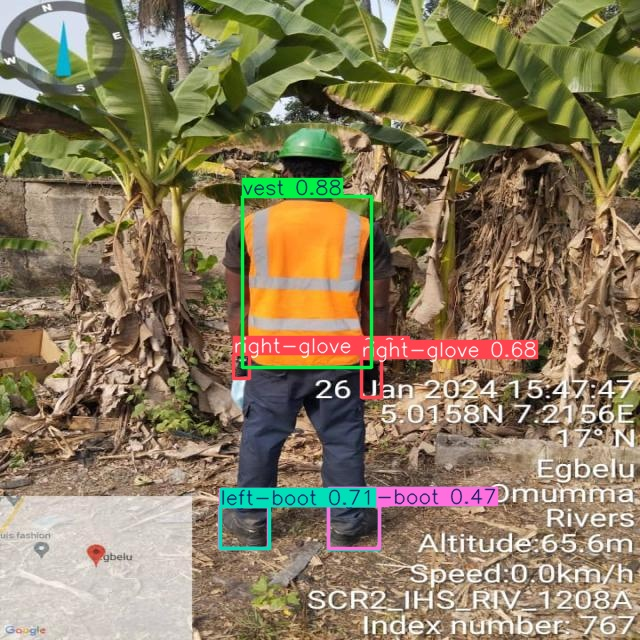

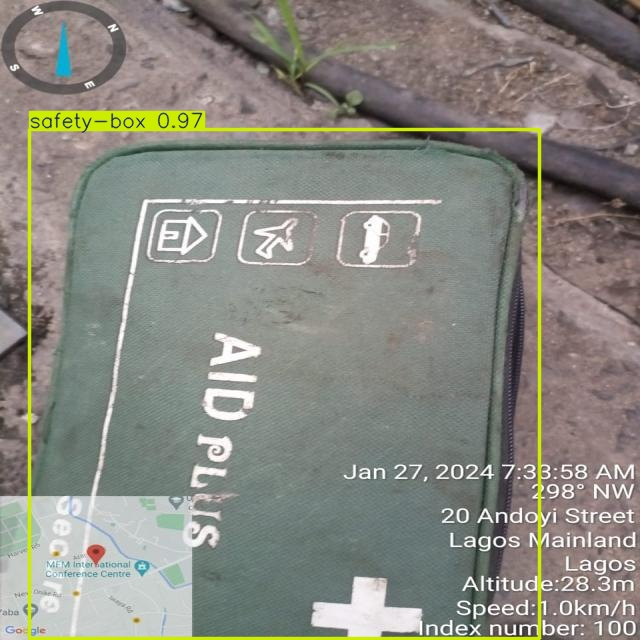

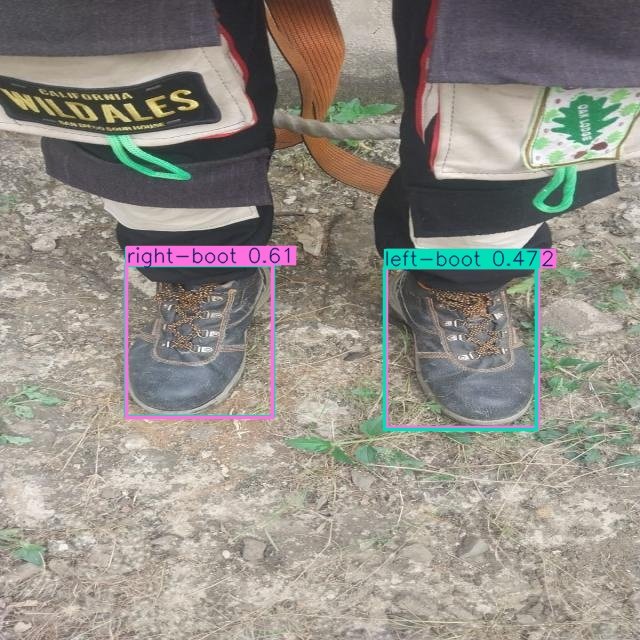

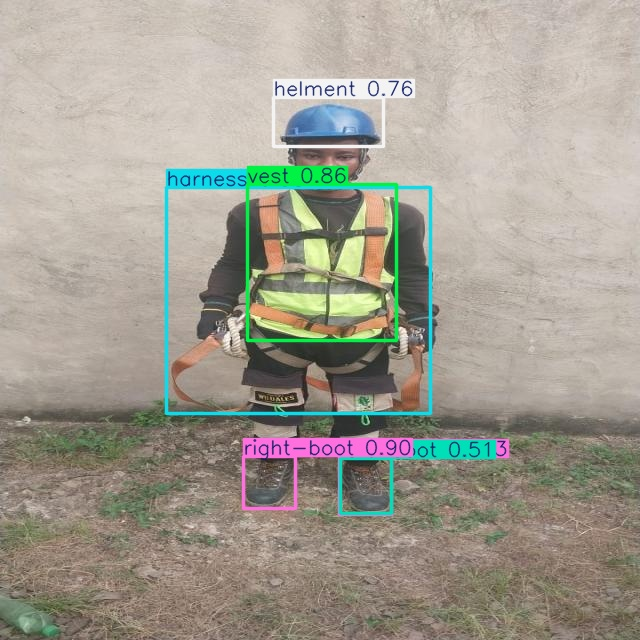

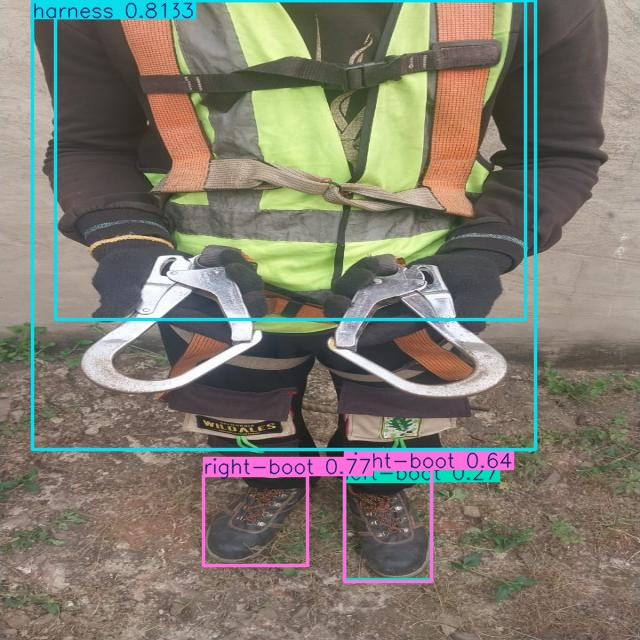

...

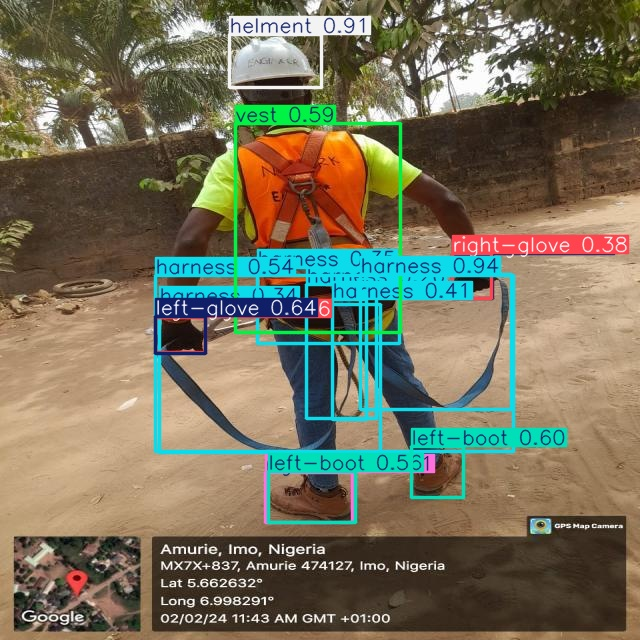

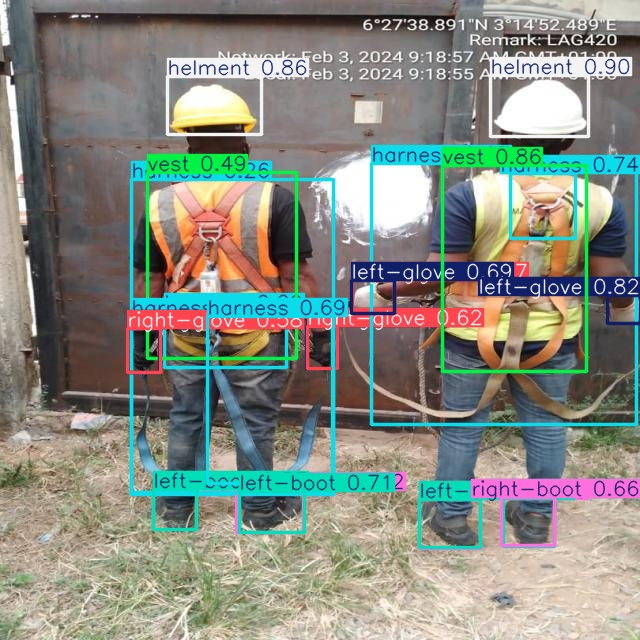

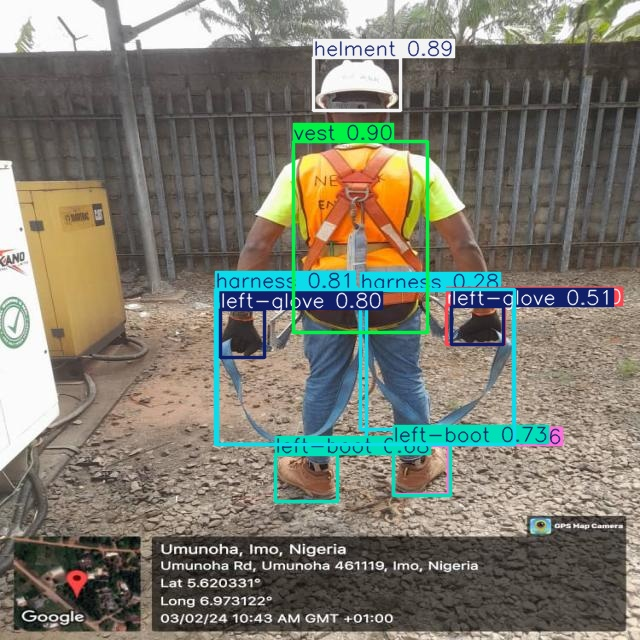

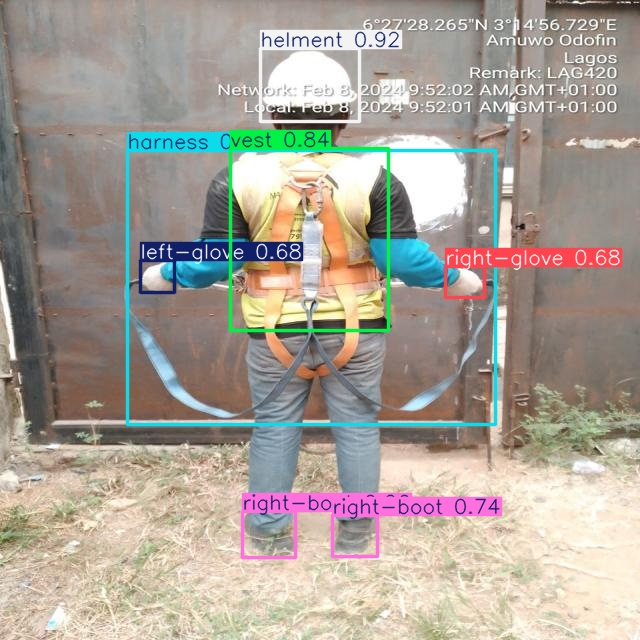

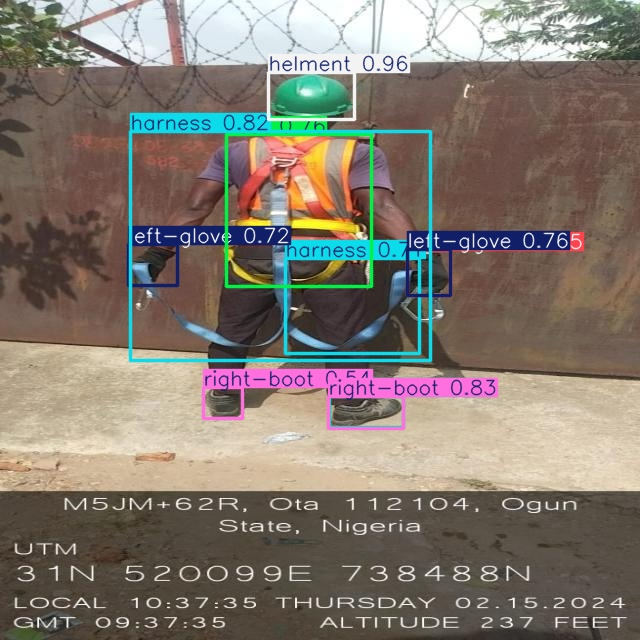

In [ ]:
import cv2
import os
from google.colab.patches import cv2_imshow # Import the Colab patch for imshow

# Specify the directory where YOLO saved the results
predictions_dir = '/content/gdrive/MyDrive/final_year_project/runs/detect/predict2'

# List all the files in the predictions directory
prediction_files = [f for f in os.listdir(predictions_dir) if f.endswith('.jpg') or f.endswith('.png')]

# Display each image
for file in prediction_files:
    img = cv2.imread(os.path.join(predictions_dir, file))
    cv2_imshow(img)  # Use the patched cv2_imshow function
    cv2.waitKey(0)  # Wait for a key press to close the image window
    cv2.destroyAllWindows()

In [ ]:
model = YOLO('/content/gdrive/MyDrive/final_year_project/runs/detect/train/weights/best.pt')

In [ ]:
model.val(split="test")

Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129067 parameters, 15963 gradients, 28.5 GFLOPs


val: Scanning /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/test/labels... 23 images, 0 backgrounds, 0 corrupt: 100%|██████████| 23/23 [00:19<00:00,  1.19it/s]

val: New cache created: /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/test/labels.cache



os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.85s/it]


                   all         23        148      0.663      0.679      0.693      0.522
          extinguisher          3          3          1      0.905      0.995      0.706
               harness         11         40      0.524        0.5      0.499       0.35
               helment         11         14      0.797      0.857      0.853      0.712
             left-boot         16         17      0.442      0.706      0.483        0.4
            left-glove         14         22      0.376       0.41      0.446      0.297
            right-boot         15         17      0.622      0.529      0.703       0.64
           right-glove         13         15      0.533        0.6      0.543      0.407
            safety-box          5          5      0.893        0.8        0.8      0.482
                  vest         15         15      0.777        0.8      0.914      0.705
Speed: 0.3ms preprocess, 39.8ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detec

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a28e7f90040>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470

In [ ]:
result = model.val()
result.results_dict

Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/gdrive/MyDrive/final_year_project/EHS-Detection-1/valid/labels.cache... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<?, ?it/s]
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.11it/s]


                   all         46        249      0.575      0.764      0.636      0.467
          extinguisher         12         12       0.87       0.75      0.811      0.583
               harness         16         69      0.402      0.406       0.36      0.167
               helment         25         26      0.892      0.955      0.975      0.578
             left-boot         26         30      0.518      0.833      0.628      0.531
            left-glove         26         29      0.328      0.554      0.285      0.202
            right-boot         23         26      0.451      0.885      0.562      0.426
           right-glove         23         25      0.454       0.76      0.484      0.376
            safety-box          7          7      0.412      0.857      0.741       0.58
                  vest         25         25      0.846      0.879      0.877      0.757
Speed: 0.5ms preprocess, 13.3ms inference, 0.0ms loss, 5.1ms postprocess per image
Results saved to runs/detec

{'metrics/precision(B)': 0.5746539476107739,
 'metrics/recall(B)': 0.764305664537773,
 'metrics/mAP50(B)': 0.6359568270048865,
 'metrics/mAP50-95(B)': 0.4666206537397365,
 'fitness': 0.4835542710662515}